# SQL, Twos Complement Binary Numbers

## Today
* Hw3 due one week from Thursday at 11:59 pm
* `emailer.py`
* `read_person` and `write_person`:
    - They need the exact same format for `Person` objects
    - `read_person` must be able to read a `Person` written with `write_person`
    - They read/write one `Person` instance only from/to the file
    - `Person` is a helper class
* The SQL you need for hw3
* Twos complement binary arithmetic
* Worksheet

https://io9.gizmodo.com/this-unsettlingly-accurate-deepfake-casts-tom-holland-a-1841731661
https://gizmodo.com/hackers-locked-every-room-in-this-hotel-until-a-bitcoin-1791769502
https://arstechnica.com/information-technology/2017/02/a-rash-of-invisible-fileless-malware-is-infecting-banks-around-the-globe/
https://arstechnica.com/science/2017/02/ohio-mans-pacemaker-data-betrays-him-in-arson-insurance-fraud-case/
https://www.businessnewsdaily.com/9739-effective-email-sign-offs.html
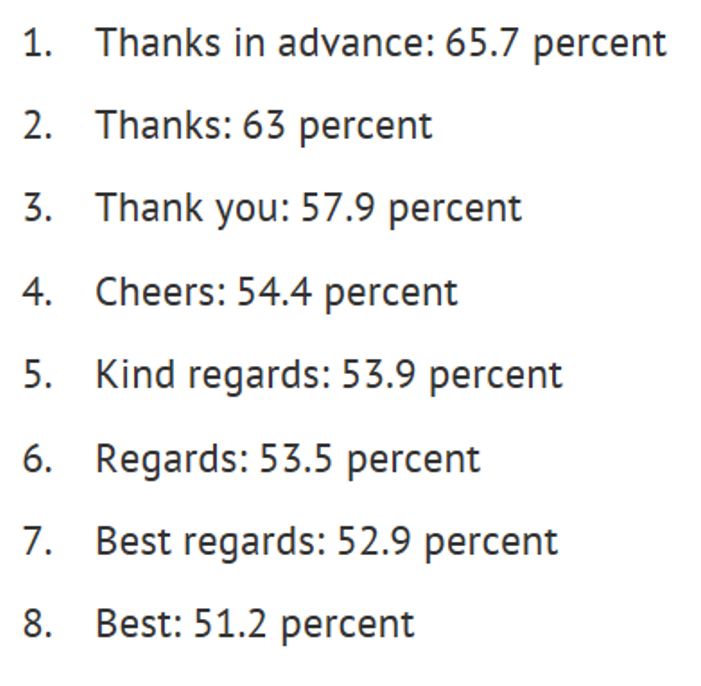

## SQL (Structured Query Language)

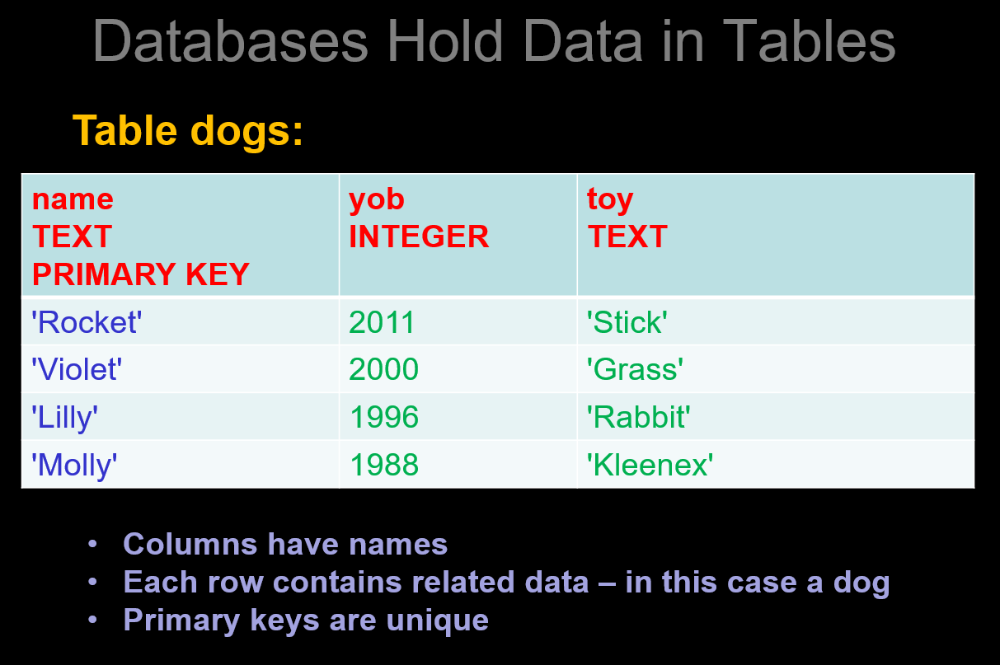

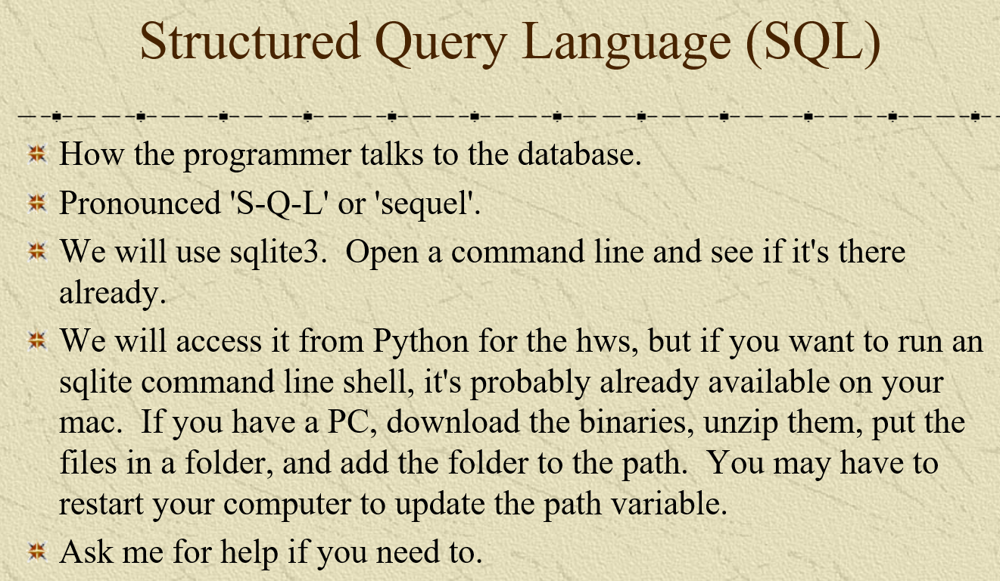

## SQLite3
* Command line interface: https://www.sqlite.org/cli.html
* Keyword doc page: https://www.sqlite.org/keyword_index.html
* SQLite3 is for real: https://www.sqlite.org/whentouse.html

## Python SQL Modules
* MySQL: http://mysql-python.sourceforge.net/MySQLdb.html
* PostgreSQL: http://initd.org/psycopg/docs/
* MS SQL Server and others: http://mkleehammer.github.io/pyodbc/
* SQLAlchemy: https://www.sqlalchemy.org/
* More: https://wiki.python.org/moin/DatabaseInterfaces

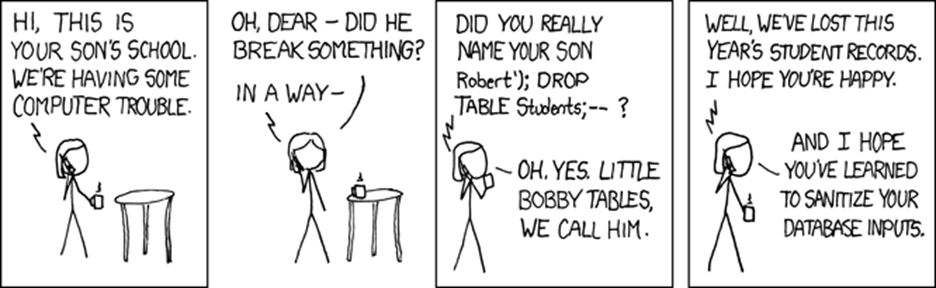

In [12]:
import os
if os.path.exists('pets.db'):
    os.remove('pets.db')

In [13]:
import sqlite3
conn = sqlite3.connect('pets.db') # conn is short for connection
conn.row_factory = sqlite3.Row # The row factory allows us to access a
    # row from a query result like a list or like a dictionary
c = conn.cursor() # Use the cursor to execute queries
query = 'CREATE TABLE dogs (name TEXT PRIMARY KEY, yob INTEGER, toy TEXT);'
c.execute(query)

In [14]:
conn.commit() # No changes are saved until this

In [15]:
query = 'INSERT INTO dogs (name, yob, toy) VALUES (?, ?, ?);'
# Always escape your values using the ? operator. 
# Often your values will come from a user.  You must do this to protect 
# yourself from SQL injection attacks.

In [16]:
c.execute(query, ('Rocket', 2011, 'stick'))
c.execute(query, ('Violet', 2001, 'grass'))

In [42]:
query = 'SELECT * FROM dogs;'
for row in c.execute(query):
    print(list(row)) # row converts into a list because it's a Row object

['Violet', 2001, 'grass']


In [18]:
next = c.fetchone()
print(next)

None


<font color=red>***You only get one pass through the result of a query. So there's nothing left for `fetchone` to grab, hence it's `None`.  But we can do the query again to check out this functionality.***

In [19]:
c.execute(query)
row = c.fetchone()
row

In [20]:
row[0], row['name'] # We can access the row as though it were a list or a dict

('Rocket', 'Rocket')

In [21]:
list(row)

['Rocket', 2011, 'stick']

In [22]:
dict(row)

{'name': 'Rocket', 'yob': 2011, 'toy': 'stick'}

## Operations Across Multiple Tables (Hw3!!!)

In [26]:
query = 'CREATE TABLE cats (name TEXT PRIMARY KEY, yob INTEGER, toy TEXT);'
c.execute(query)

In [27]:
conn.commit() # No changes are saved until this

In [28]:
query = 'INSERT INTO cats (name, yob, toy) VALUES (?, ?, ?);'
# Always escape your values using the ? operator. 
# Often your values will come from a user.  You must do this to protect 
# yourself from SQL injection attacks.

In [29]:
c.execute(query, ('Hobbes', 1990, 'collars'))
c.execute(query, ('Euclid', 2001, 'birds'))

In [30]:
query = 'SELECT * FROM cats;'
for row in c.execute(query):
    print(list(row)) # row converts into a list because it's a Row object

['Hobbes', 1990, 'collars']
['Euclid', 2001, 'birds']


## UNION

In [32]:
query = 'SELECT * FROM dogs UNION SELECT * FROM cats;'
c.execute(query)
for row in c.fetchall():
    print(list(row))

['Euclid', 2001, 'birds']
['Hobbes', 1990, 'collars']
['Rocket', 2011, 'stick']
['Violet', 2001, 'grass']


## JOIN

<font color=red>***This one is not quite what we need for hw3:***

In [33]:
query = 'SELECT * FROM dogs JOIN cats ON dogs.yob = cats.yob;'
c.execute(query)
for row in c.fetchall():
    print(list(row))

['Violet', 2001, 'grass', 'Euclid', 2001, 'birds']


<font color=red>***Better for hw3:***

In [39]:
query = ('SELECT dogs.name, dogs.yob, dogs.toy FROM ' +
        'dogs JOIN cats ON dogs.yob = cats.yob;')
c.execute(query)
for row in c.fetchall():
    print(list(row))

['Violet', 2001, 'grass']


In [51]:
query = 'DELETE FROM dogs WHERE name = ?;'
c.execute(query, ('Rocket',))
query = 'SELECT * FROM dogs;'
c.execute(query)
for row in c.fetchall():
    print(list(row))

['Violet', 2001, 'grass']


In [52]:
conn.commit() # Save our changes to the db
conn.close()

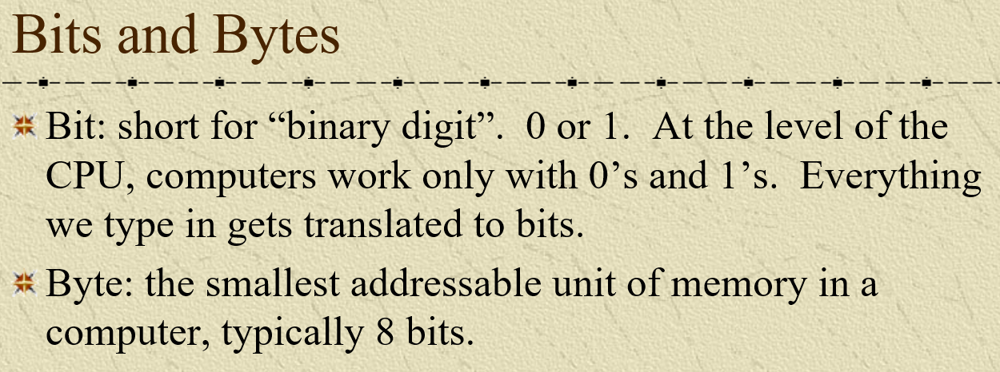

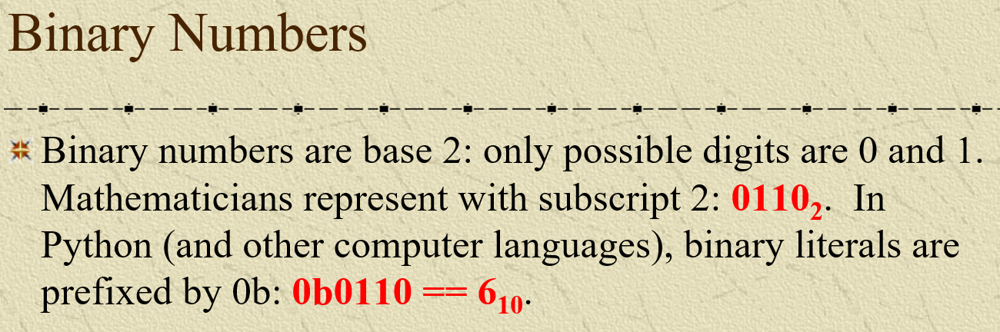

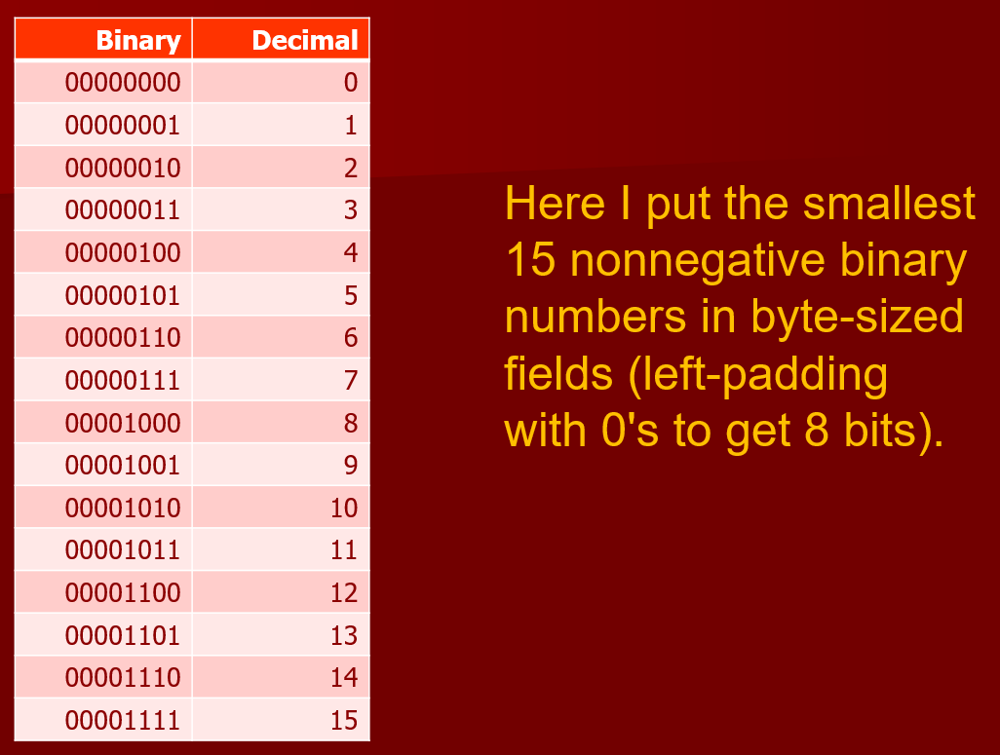

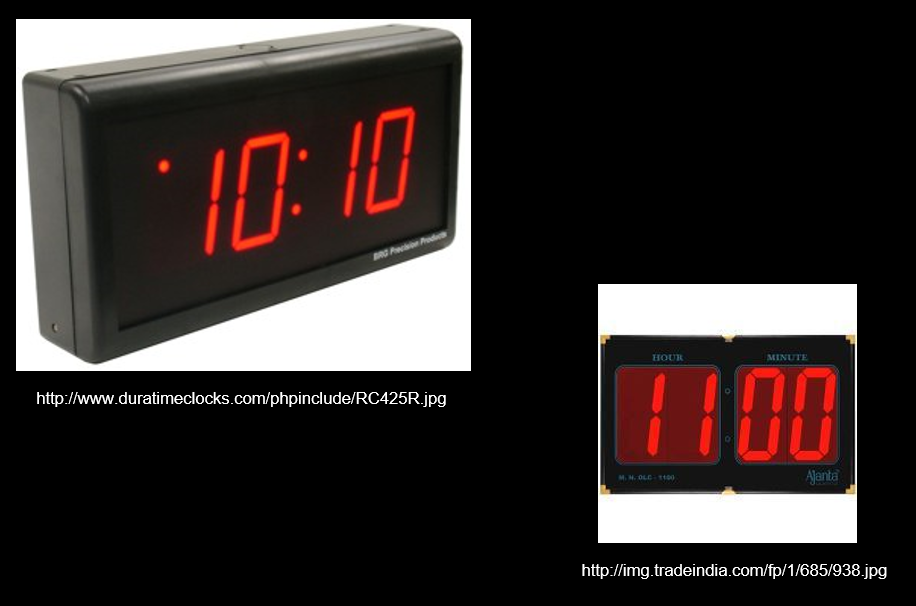

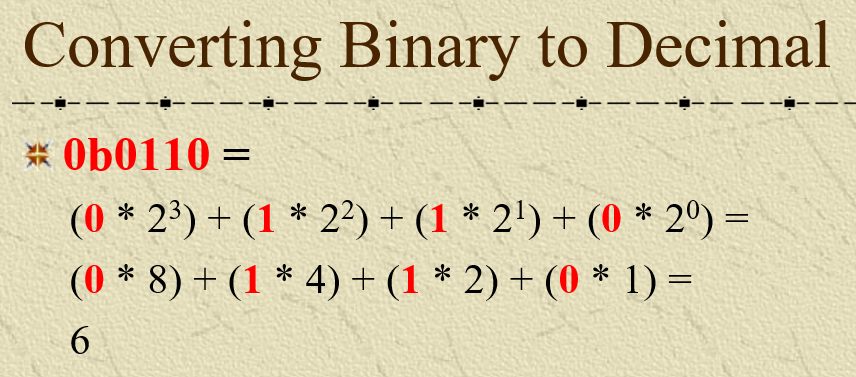

...

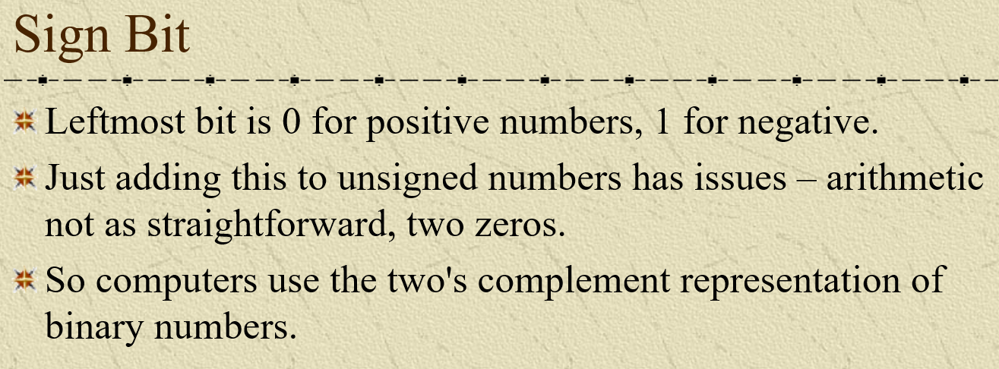

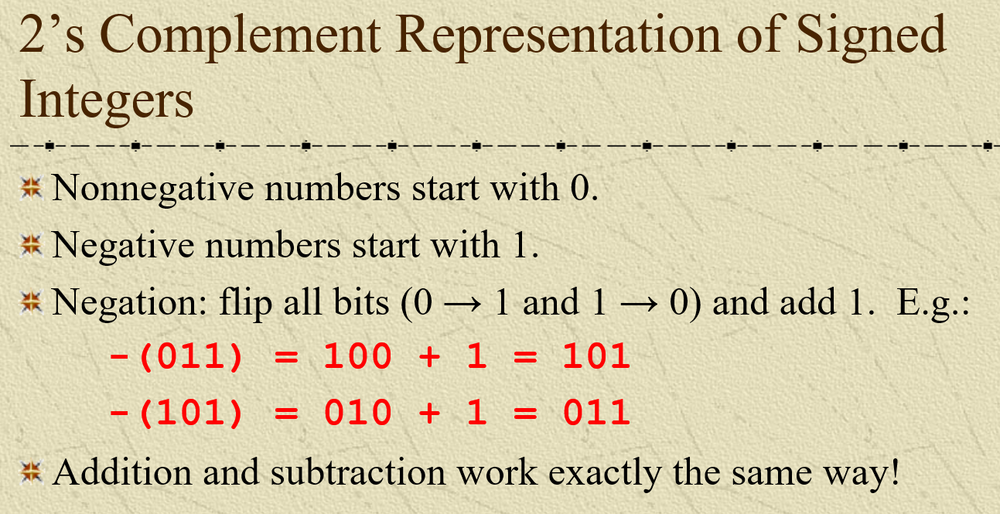

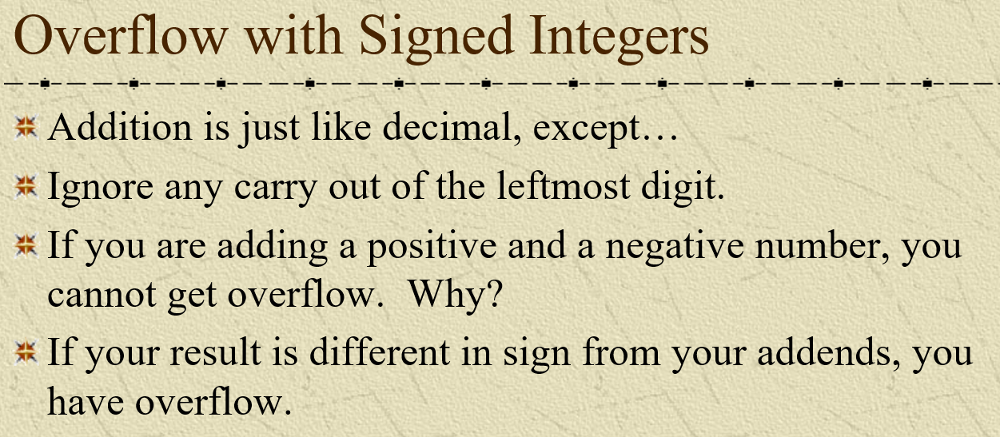

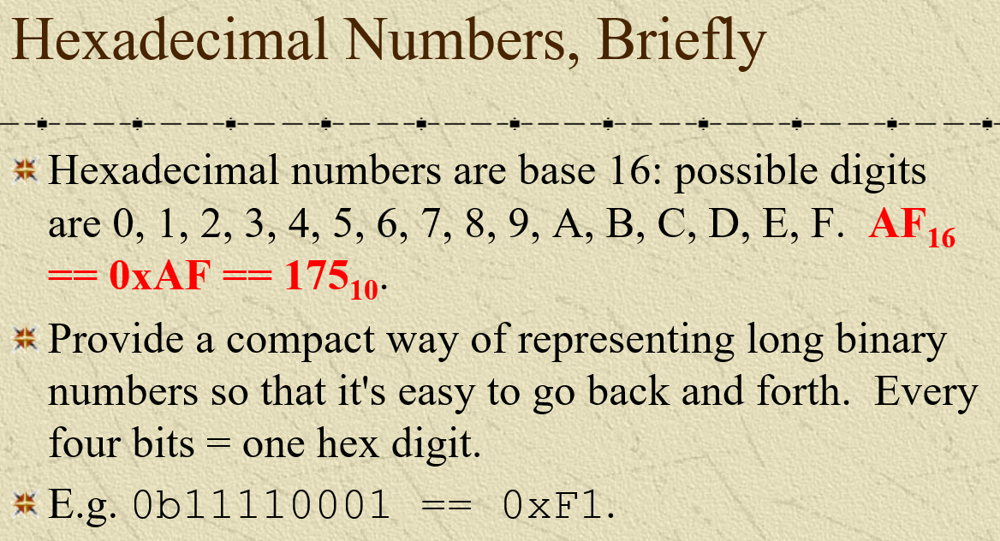

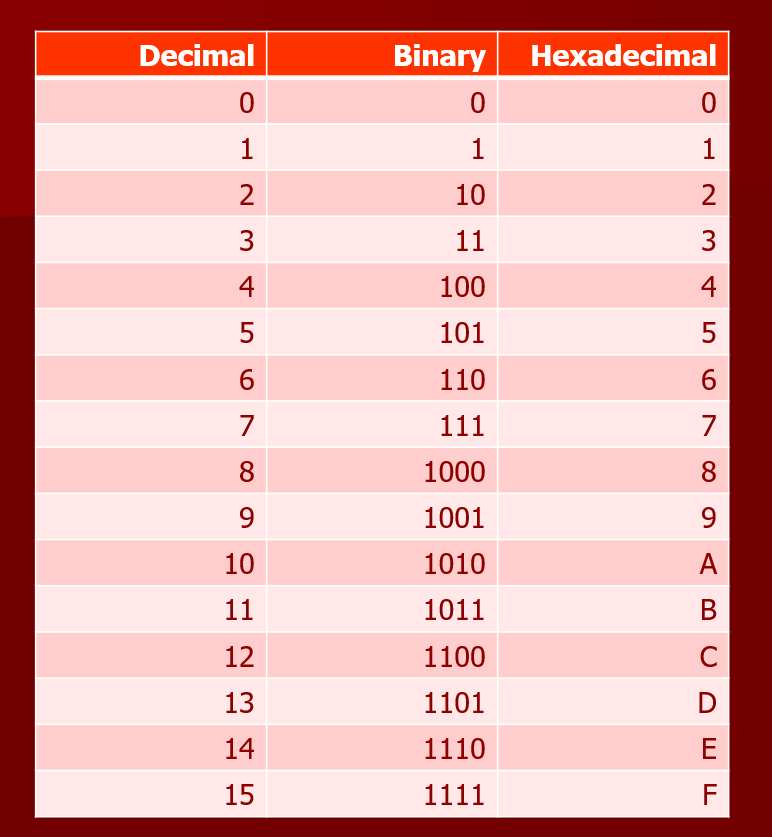

## Worksheet

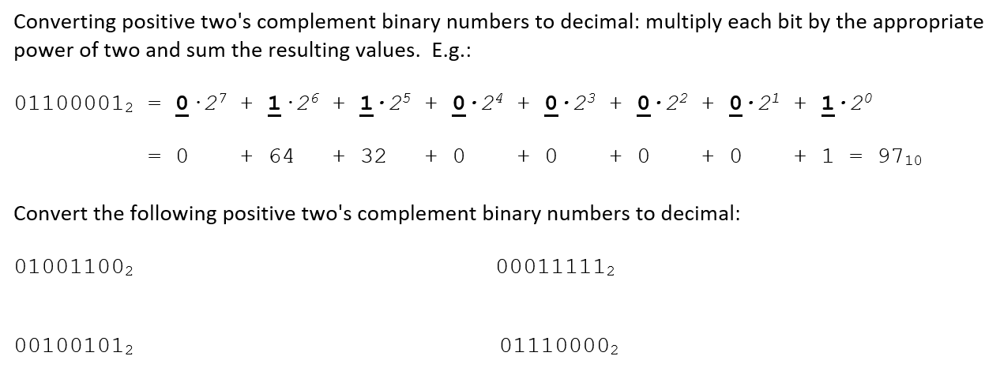

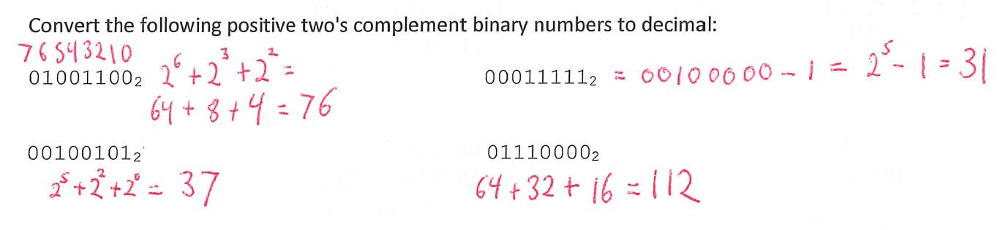

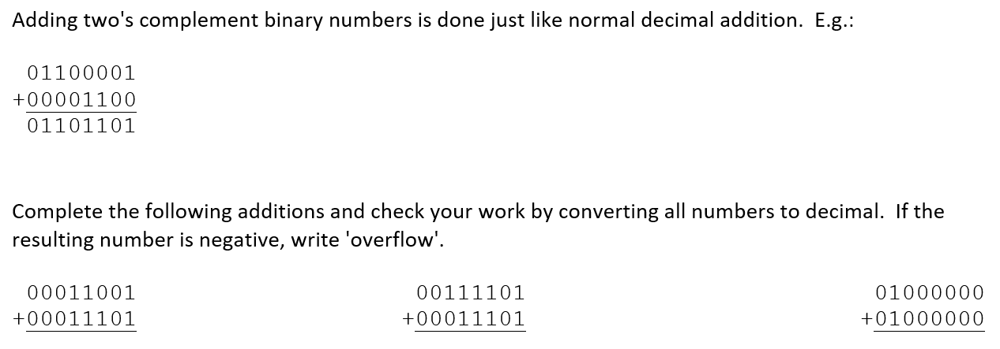

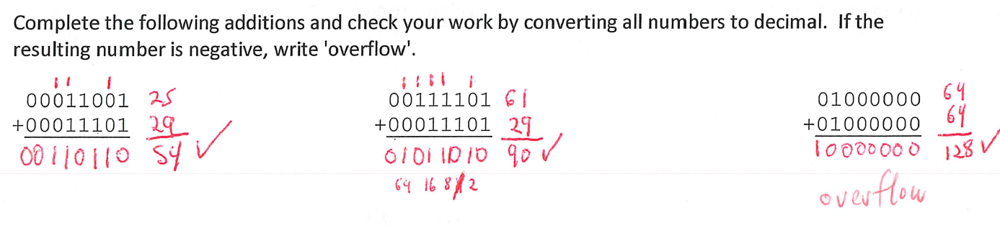

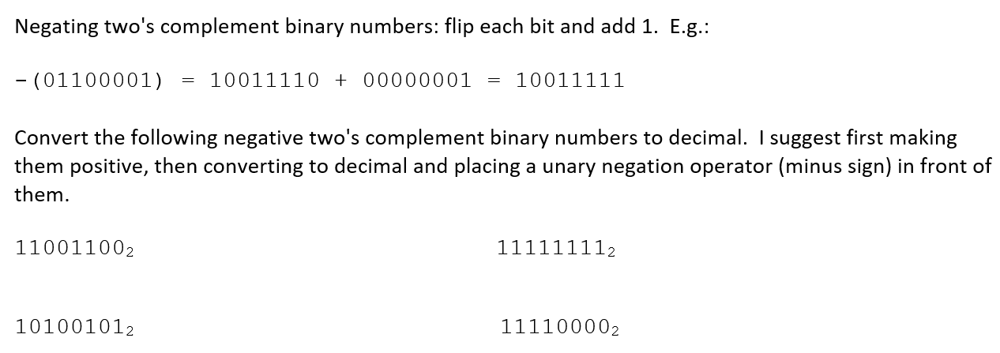

...

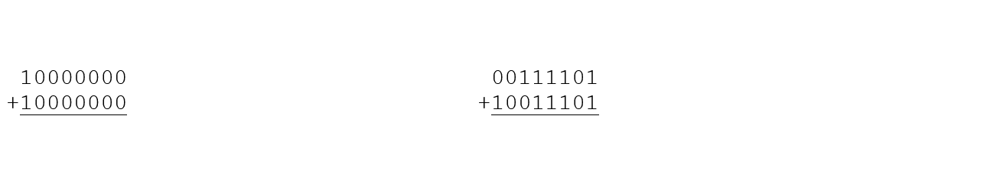

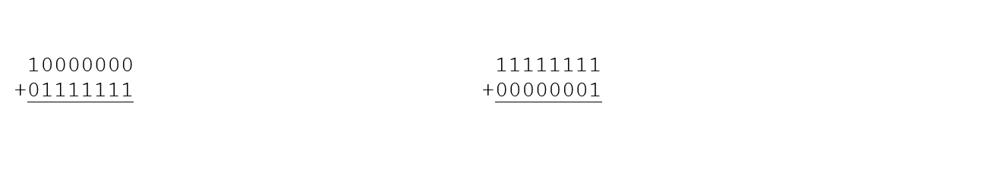

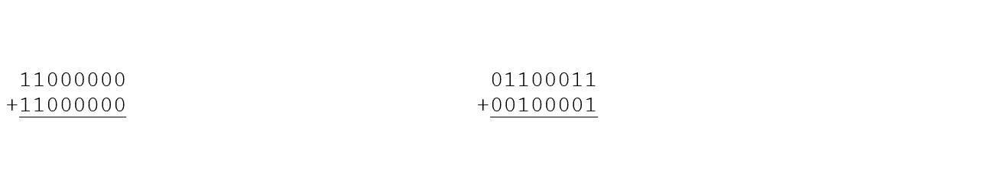

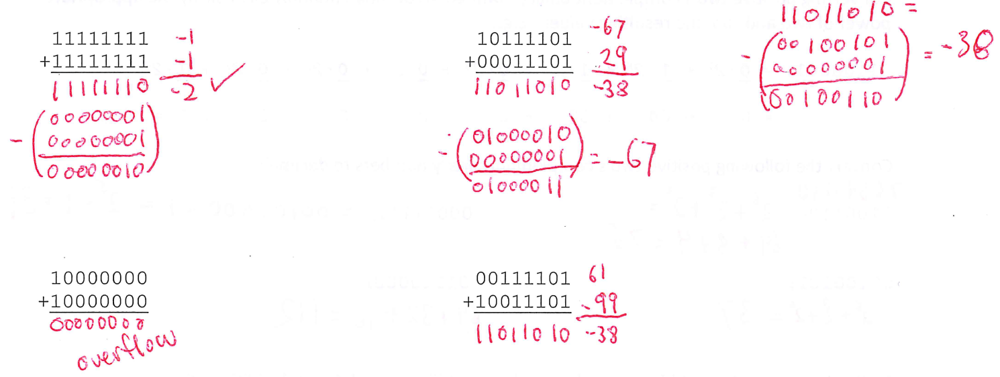

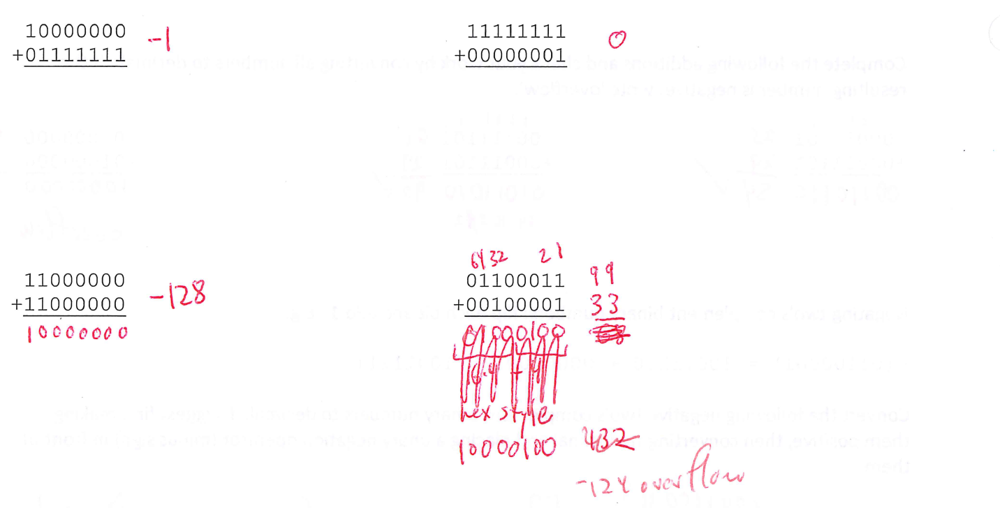